In [3]:
import pickle
import torch
import dgl
import matplotlib.pyplot as plt
import networkx as nx
from classes import *
from torch.utils.data import DataLoader
import pickle
from torch.utils.tensorboard import SummaryWriter
import torch.nn.functional as F
import numpy as np
from dgl import DGLGraph
from mpl_toolkits.mplot3d import Axes3D


In [4]:

data_path = '../data/cube_data.pickle'

with open(data_path,"rb") as f:
  dataa = pickle.load(f)


# model_path = 'models/GCNmiddropmodel.pth'
# net = midNet()
model_path = 'models/incustomnet.pth'
net = incustomNet()
net.load_state_dict(torch.load(model_path))
net.eval()

incustomNet(
  (layer1): customConv(
    (theta1): Linear(in_features=6, out_features=32, bias=True)
    (theta2): Linear(in_features=32, out_features=32, bias=True)
    (theta4): Linear(in_features=32, out_features=32, bias=True)
  )
  (layer4): customConv(
    (theta1): Linear(in_features=32, out_features=3, bias=True)
    (theta2): Linear(in_features=3, out_features=3, bias=True)
    (theta4): Linear(in_features=3, out_features=3, bias=True)
  )
)

In [5]:
i=60020
g = dataa[i]["edge"]  #.to(device=device, non_blocking=True)
features= dataa[i]["coor"]  #.to(device=device, non_blocking=True)
campos = dataa[i]["cam"]
g = DGLGraph(g)
print(campos)



[-0.17816574 -0.03971747  4.29418799]


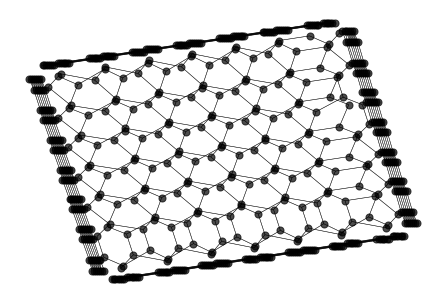

In [6]:

options = {
    'node_color': 'black',
    'node_size': 50,
    'width': 0.5,
    'arrows': False,
    'alpha':0.7,
    'vmin':0,
    'vmax':1
}
plt.figure(1)
nx.draw(g.to_networkx(),pos=features[:,1:3],cmap=plt.cm.Blues,**options)
#plot corrrect,



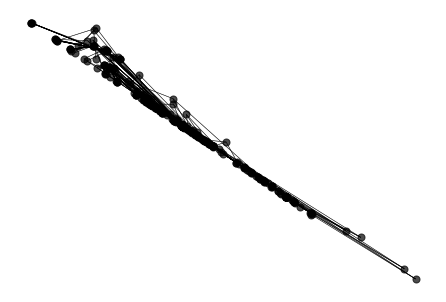

In [11]:
extra = np.ones((588,3))
featurest = torch.Tensor(np.hstack((features,extra)))   #.to(device=device, non_blocking=True)
outputt = net(g,featurest)
output = outputt.cpu().detach().numpy()
plt.figure(2)
nx.draw(g.to_networkx(),pos=output[:,1:3],**options)
plt.show()
#plot outpout


/data/vision/billf/scratch/ztzhang/nonrigid/jma/enter/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: Using a target size (torch.Size([588, 6])) that is different to the input size (torch.Size([588, 3])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


RuntimeError: The size of tensor a (3) must match the size of tensor b (6) at non-singleton dimension 1

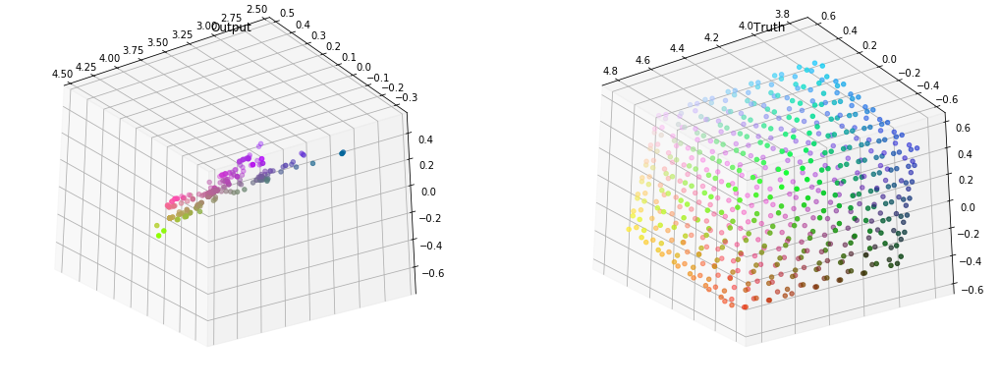

In [15]:

fig = plt.figure(figsize=(18,7))
ax = fig.add_subplot(121, projection='3d')
X = output[:,0]
Y = output[:,1]
Z = output[:,2]
colors = (output-output.min(axis=0))/(output.max(axis=0)-output.min(axis=0))
# colors = (output-(-10))/(10)-(-10))
ax.set_title('Output')
ax2 = fig.add_subplot(122, projection='3d')
xs = features[:,0]
ys = features[:,1]
zs = features[:,2]
colors2 = (features-features.min(axis=0))/(features.max(axis=0)-features.min(axis=0))
ax2.set_title('Truth')

elev = -30
azim = 125
# elev = 0
# azim = 0
ax.view_init(elev=elev, azim=azim)
ax2.view_init(elev=elev, azim=azim)
ax.scatter3D(X, Y, Z, c=colors )
ax2.scatter3D(xs, ys, zs,c=colors2)
loss = F.l1_loss(outputt,featurest).item()
plt.show()
print("L1Loss:{}".format(loss))



lol
lol2


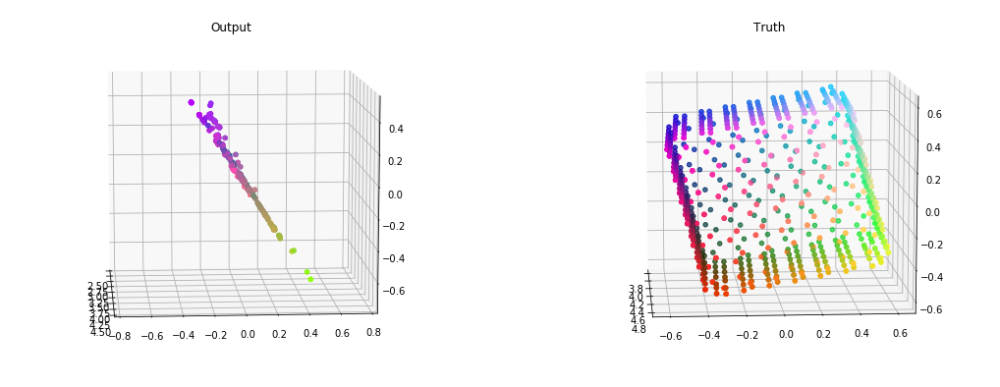

In [13]:


from matplotlib import animation

fig = plt.figure(figsize=(18,7))
ax = fig.add_subplot(121, projection='3d')
ax.set_title('Output')
ax2 = fig.add_subplot(122, projection='3d')
ax2.set_title('Truth')
ax.set_ylim(-0.8,0.8)

def init():
    ax.scatter3D(X, Y, Z, c=colors )
    ax2.scatter3D(xs, ys, zs,c=colors2)
    return fig

def animate(i):
    ax.view_init(elev=10., azim=i*4)
    ax2.view_init(elev=10., azim=i*4)
    return fig

# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=90, interval=20)
print("lol")
# Save
anim.save('basic_animation.mp4', writer = "ffmpeg",fps=30, extra_args=['-vcodec', 'libx264'])

print("lol2")
# In[46]:


plt.rcParams["animation.html"] = "jshtml"
anim